In [6]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(patchwork)
library(tibble)
library(qs)
library(ggplot2)
library(ggridges)
library(tidyr)
library(RColorBrewer)
library(readxl)
library(stringr)
library(ggpubr) 
library(viridis)

seed <- 123
set.seed(seed)
options(dplyr.summarise.inform = FALSE)

setwd("/home/a.garg/integration_project/step_14/11march_final")

In [16]:
sessionInfo()

R version 4.3.2 (2023-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/a.garg/.local/share/r-miniconda/envs/seurat5_test/lib/libopenblasp-r0.3.25.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/Chicago
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] viridis_0.6.4      viridisLite_0.4.2  ggpubr_0.6.0       stringr_1.5.1     
 [5] readxl_1.4.3       RColorBrewer_1.1-3 tidyr_1.3.0        ggridges_0.5.5    
 [9] qs_0.25.6          tibble_3.2.1 

In [ ]:
#sobj_new <- qread("/home/a.garg/integration_project/step_10/All_edited_cell_type/Allfour_SCT_integration_layer_wdedited_cells.qs", nthreads = 6)
#sobj_new[["RNA"]] <- JoinLayers(sobj_new[["RNA"]])
#sobj_new <- SCTransform(sobj_new, assay = "RNA", verbose = TRUE) # runtime approx 2h
#qsave(sobj_new, "/home/a.garg/integration_project/step_14/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs", nthreads = 6)

In [7]:
sobj_new <- qread("/home/a.garg/integration_project/step_14/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs", nthreads = 6)

In [4]:
table(sobj_new$Integrated_cell_type)


            Activated               Cycling           Homeostatic 
                11542                  1723                 46705 
                  IFN        Inflammatory_I       Inflammatory_II 
                12018                 35571                 15017 
     Inflammatory_III      Lipid_Processing                 MHCII 
                 4201                  1479                 18843 
          Mic-reduced Neuronal_Surveillance      Stress_Signature 
                19277                 26385                 14814 

In [5]:
sobj_new_sub <- subset(sobj_new, subset = Integrated_cell_type == "Homeostatic" | Integrated_cell_type =="Activated")

In [6]:
table(sobj_new_sub$Integrated_cell_type)


  Activated Homeostatic 
      11542       46705 

In [5]:
qual_col_pals <- brewer.pal.info[brewer.pal.info$category == "qual", ]
col_vector <- unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))

In [12]:
p1 <- DimPlot(sobj_new, raster = "FALSE", reduction = "umap.cca", group.by = "Integrated_cell_type", alpha = 0.5, label = TRUE, pt.size = 0.5, label.size = 3, repel = TRUE, cols = col_vector[c(1:11, 14)], label.box = TRUE)


#sobj_new_sub
p2 <- DimPlot(sobj_new_sub, raster = "FALSE", reduction = "umap.cca", group.by = "Integrated_cell_type", alpha = 0.5, label = TRUE, pt.size = 0.5, label.size = 3, repel = TRUE, cols = col_vector[c(1:11, 14)], label.box = TRUE)


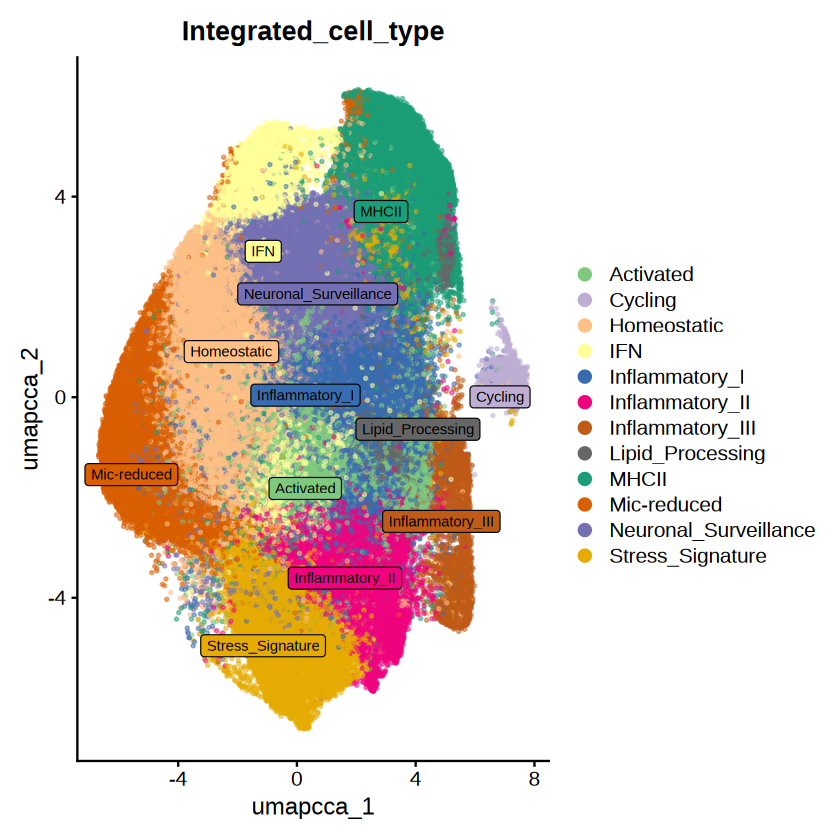

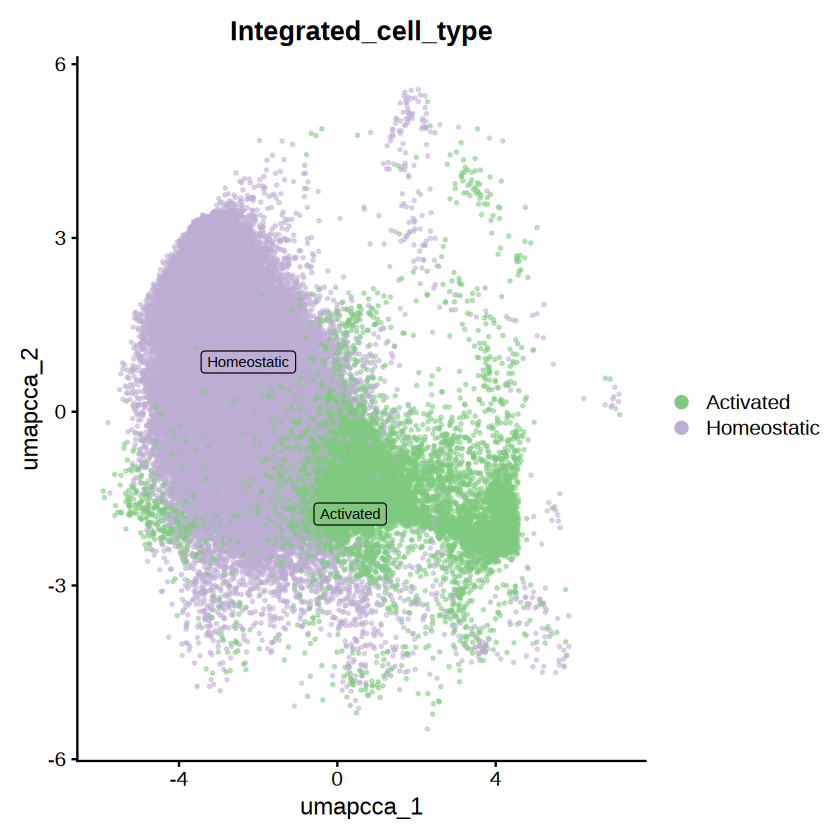

In [13]:
p1
p2

In [2]:
AD_before_annot <- readRDS(file = "/home/a.garg/integration_project/step_14/ADwithout_white_before_annot.rds")

In [14]:
table(AD_before_annot@meta.data$original_ID, AD_before_annot$sample_ID)

       
        AD-1 AD-2 AD-3
  2-3   2757    0    0
  2-8      0 2048    0
  T4857    0    0 3079

In [13]:
AD_before_annot@meta.data$original_ID[grepl("TTGTGCAGCCACGTCA", rownames(AD_before_annot@meta.data))]

[1] "2-3"   "2-8"   "T4857"

In [16]:
AD_before_annot

An object of class Seurat 
97133 features across 7884 samples within 4 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 layers present: data, scale.data
 3 other assays present: Spatial, SCT, RNA
 2 dimensional reductions calculated: pca, umap
 3 images present: slice1, slice1.2, slice1.3

In [8]:
table(AD_before_annot@meta.data$seurat_clusters)


   0    1    2    3    4    5    6    7    8    9   10   11   12 
1303 1064  907  885  870  761  608  579  278  193  168  148  120 

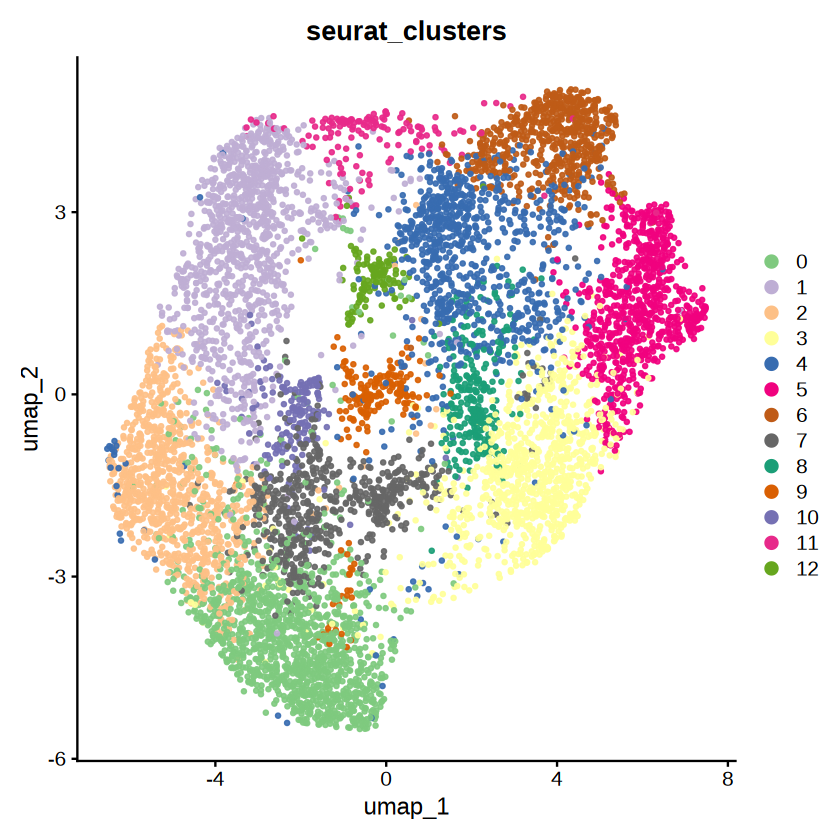

In [15]:
p<- DimPlot(AD_before_annot, reduction = "umap", group.by = "seurat_clusters", raster = FALSE, cols = col_vector[c(1:13)], pt.size = 0.8, alpha = 0.9)
p
ggsave(plot = p, "/home/a.garg/integration_project/step_14/11march_final/AD_graymatter_umap.pdf", height = 4, width = 4, bg = "white")

In [17]:
    anchors <- FindTransferAnchors(reference = sobj_new_sub, query = AD_before_annot, normalization.method = "SCT", k.anchor = 10)
    predictions.assay <- TransferData(anchorset = anchors, refdata = sobj_new_sub$Integrated_cell_type, prediction.assay = TRUE, weight.reduction = AD_before_annot[["pca"]], dims = 1:15)
    AD_before_annot[["predictions"]] <- predictions.assay

Normalizing query using reference SCT model

Warning message:
“No layers found matching search pattern provided”
Performing PCA on the provided reference using 2963 features as input.

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 265 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [26]:
dir <- "/home/a.garg/integration_project/step_14/"
qsave(AD_before_annot, paste0(dir, "AD_afteranno_wd_Hom_activ_29_feb", ".qs"))

In [5]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_29_feb.qs")

In [20]:
rownames(as.data.frame(rowSums(file@assays$predictions$data)[rowSums(file@assays$predictions$data) > 0]))

[1] "Homeostatic" "Activated"   "max"

in all layers

In [6]:
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)

file$barcode <- colnames(file)
score_data <- as.data.frame(t(file@assays$predictions$data))
score_data$barcode <- rownames(score_data)

if (all(rownames(score_data) == colnames(file))) {
    data1 <- merge(x = file@meta.data, y = score_data)
}


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Saving 6.67 x 6.67 in image
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Saving 6.67 x 6.67 in image
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


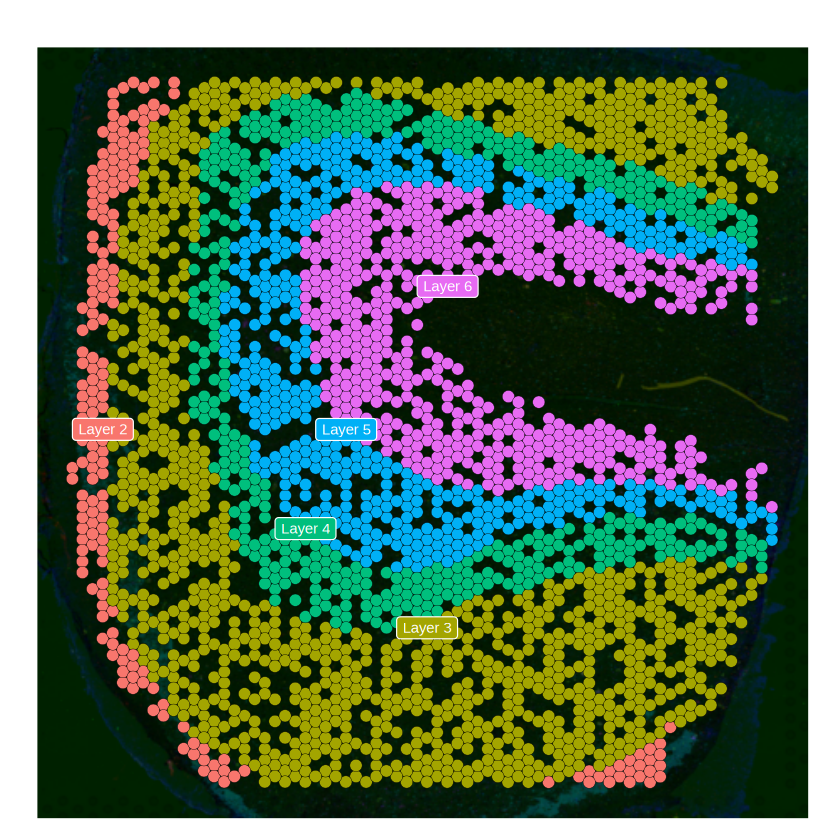

Saving 6.67 x 6.67 in image


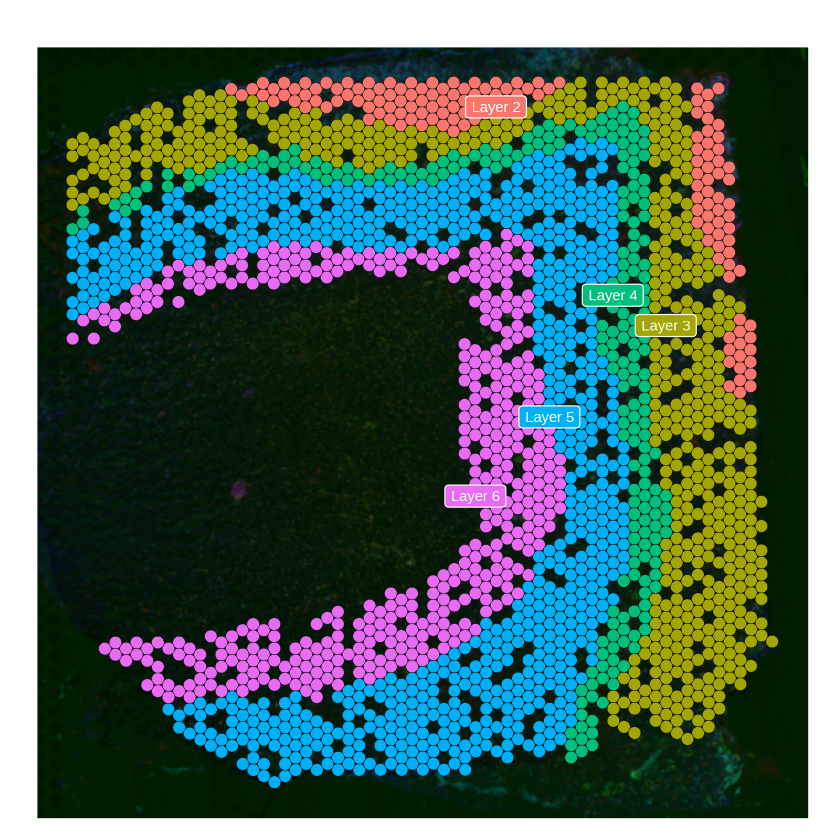

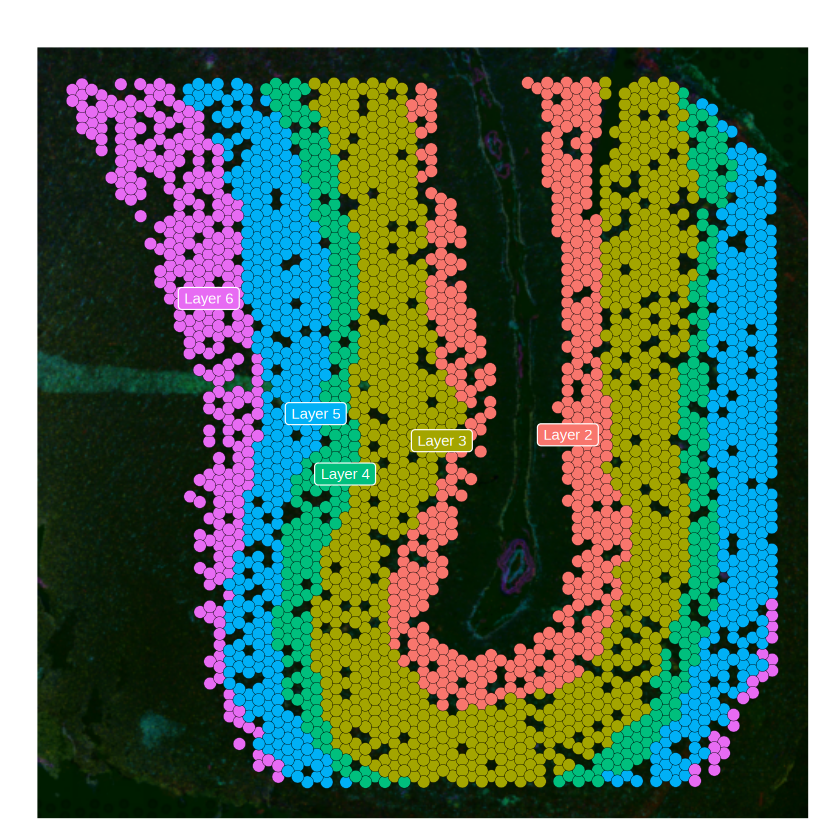

In [12]:
    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file,label.size = 3, images = image, label = T, group.by = "layer_annotation")+ggtitle("")+NoLegend()
        plot(p)
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste(image, "_layer_annotation.pdf", sep = ""), p, path = dir)

    }

with layer 2-6 labels

Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


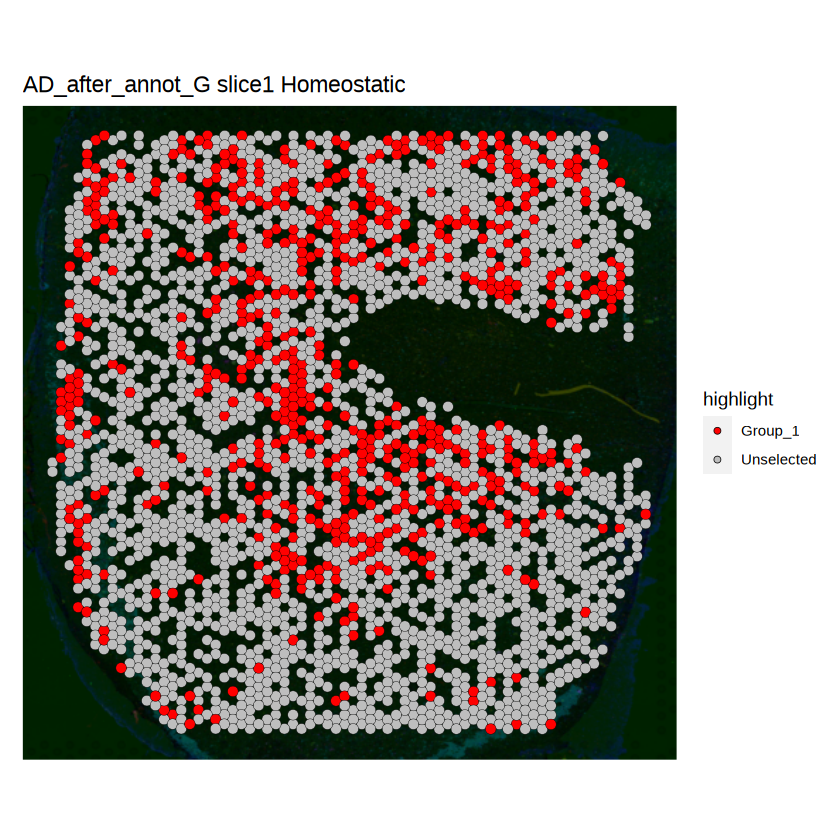

Saving 6.67 x 6.67 in image


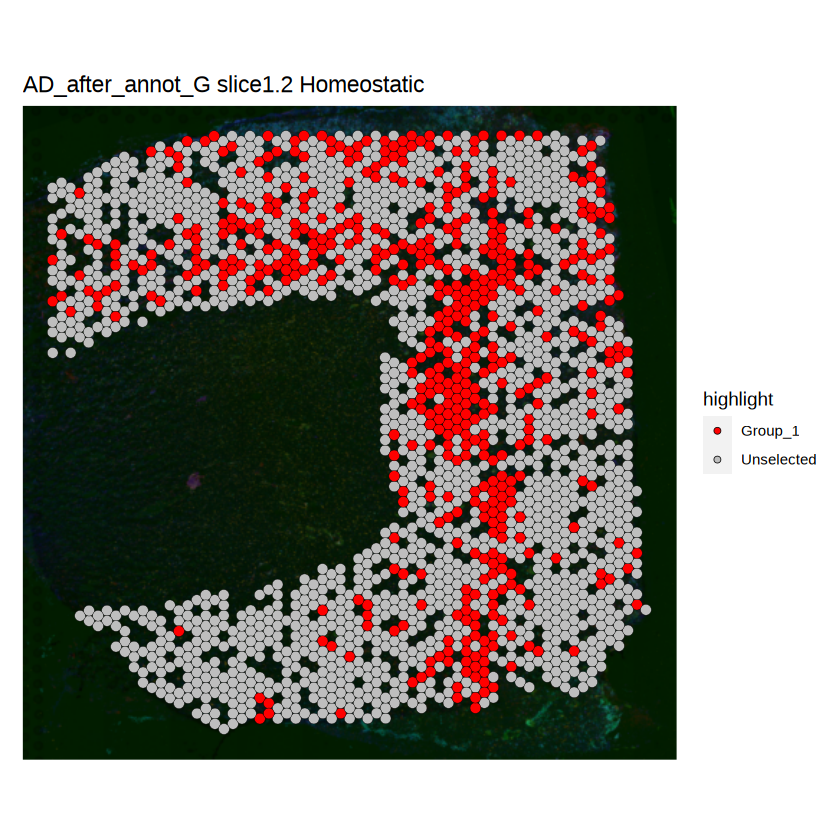

Saving 6.67 x 6.67 in image


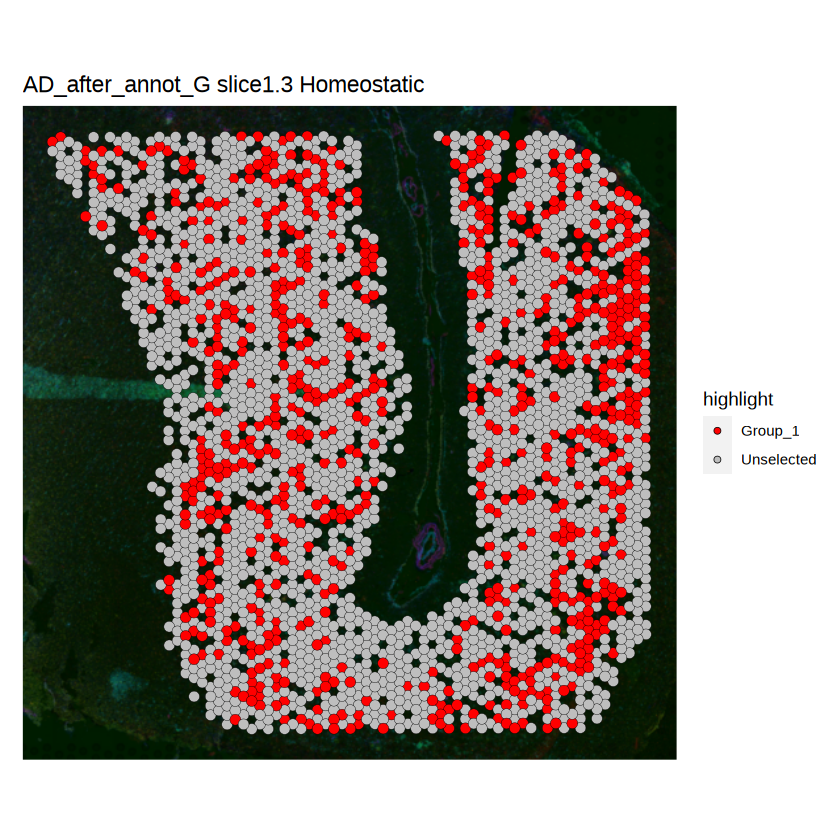

Saving 6.67 x 6.67 in image


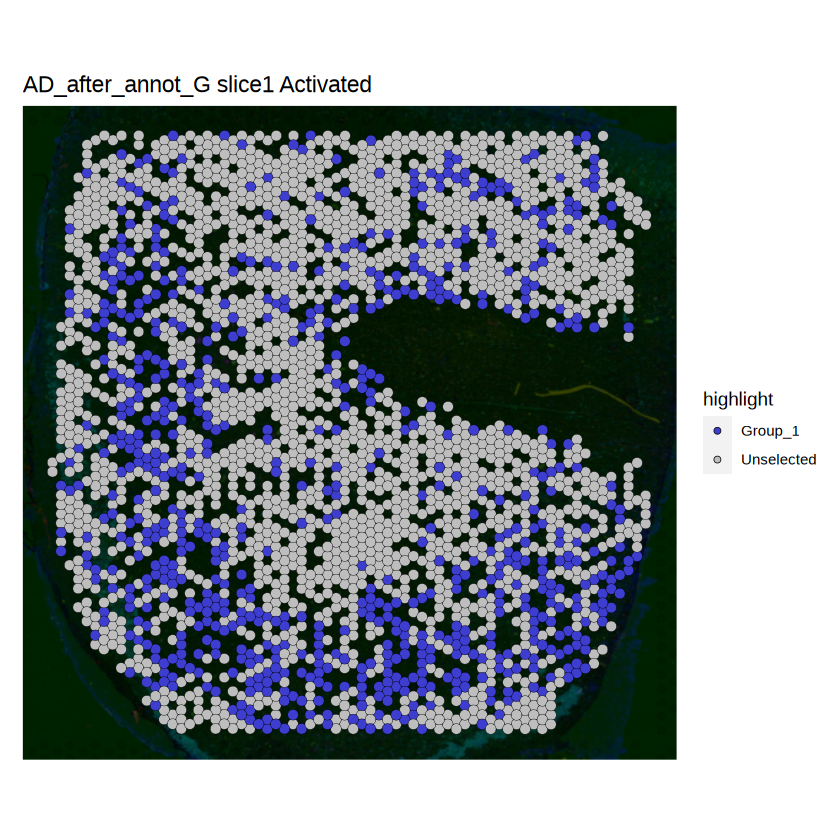

Saving 6.67 x 6.67 in image


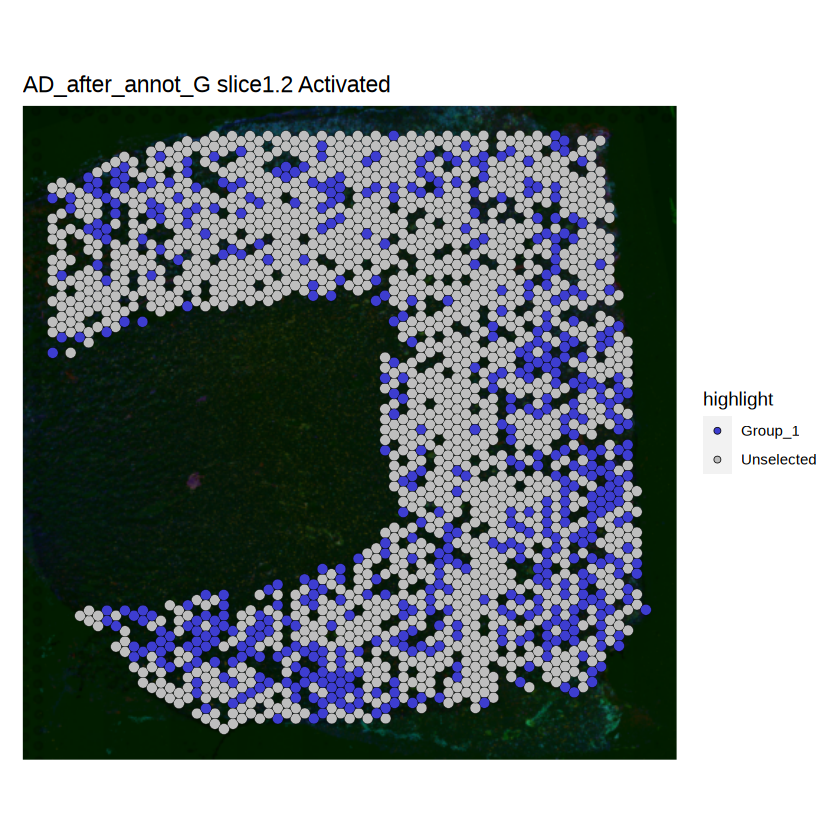

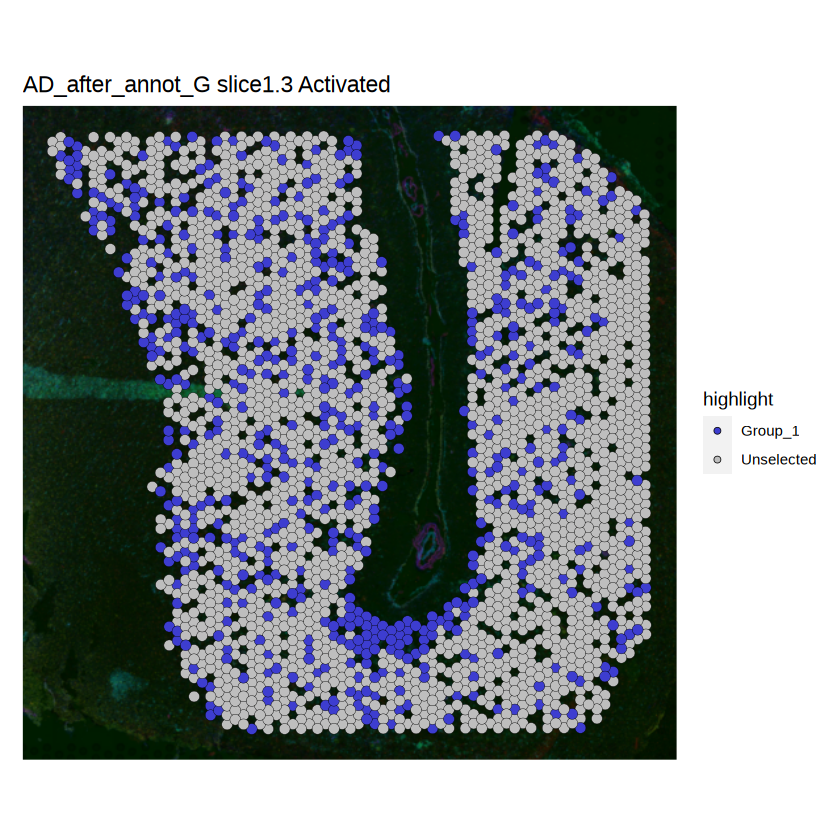

In [9]:
cell_state_list <- c('Homeostatic')

plot1 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
     cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#FF0000", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("All_", nm, "_", image, "_layer2-6_.pdf", sep = ""), p1, path = dir)
    }
})

cell_state_list <- c('Activated')

plot2 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
    
     cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#3D3DD0", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("All_", nm, "_", image, "_layer2-6_.pdf", sep = ""), p1, path = dir)
    }
})

Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


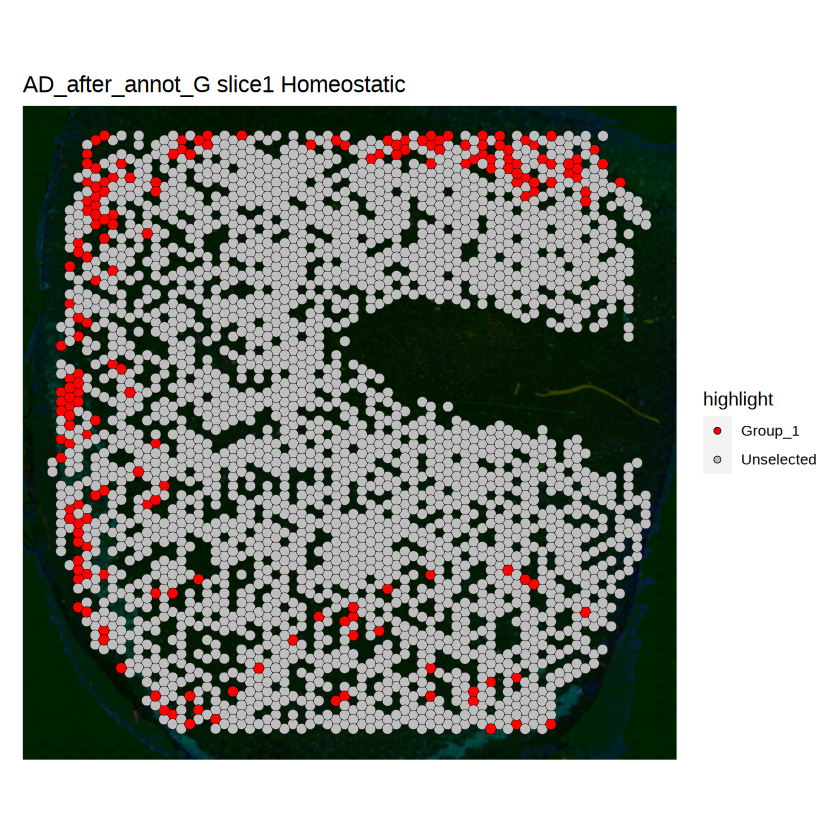

Saving 6.67 x 6.67 in image


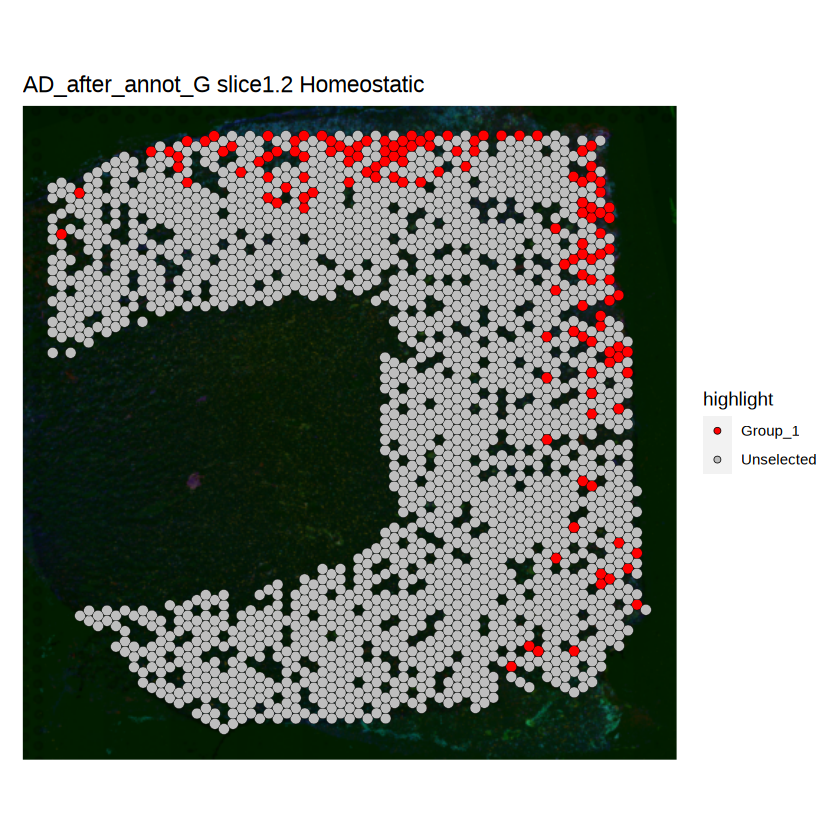

Saving 6.67 x 6.67 in image


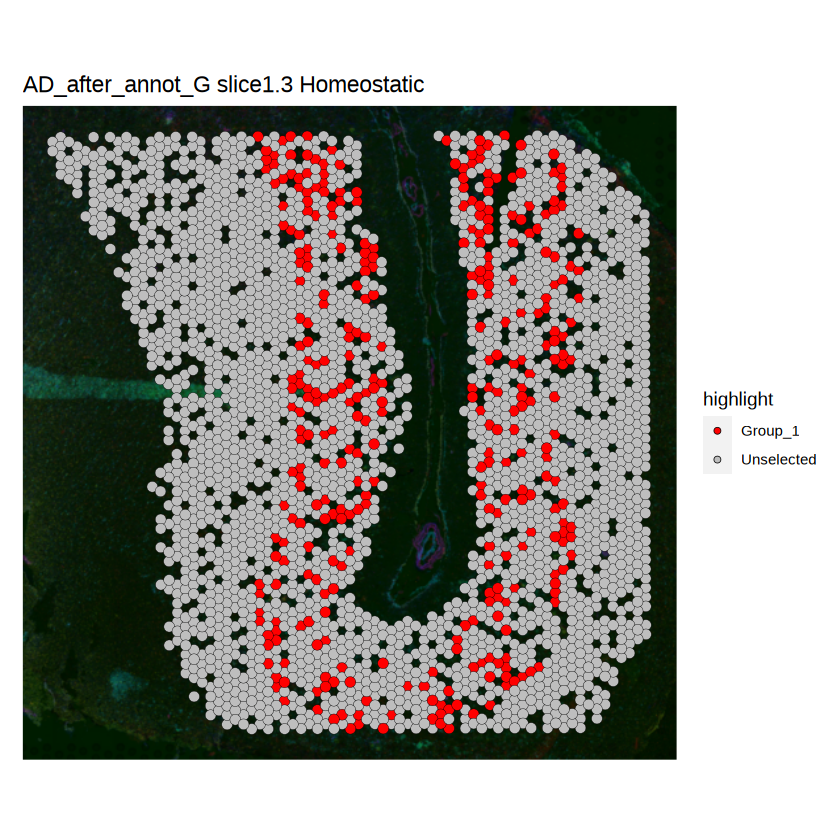

Saving 6.67 x 6.67 in image


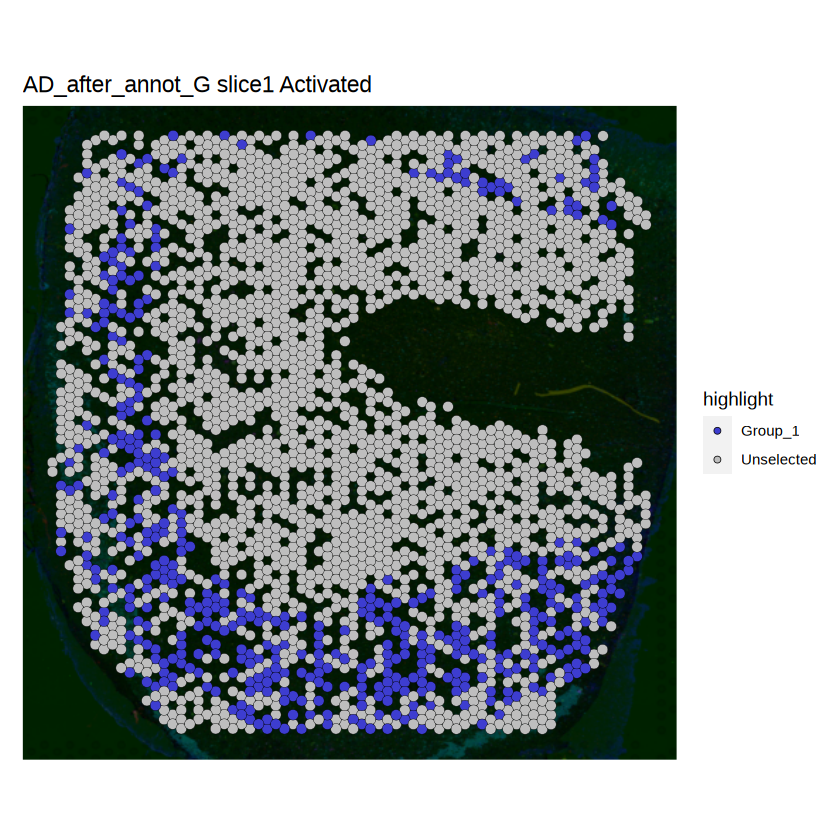

Saving 6.67 x 6.67 in image


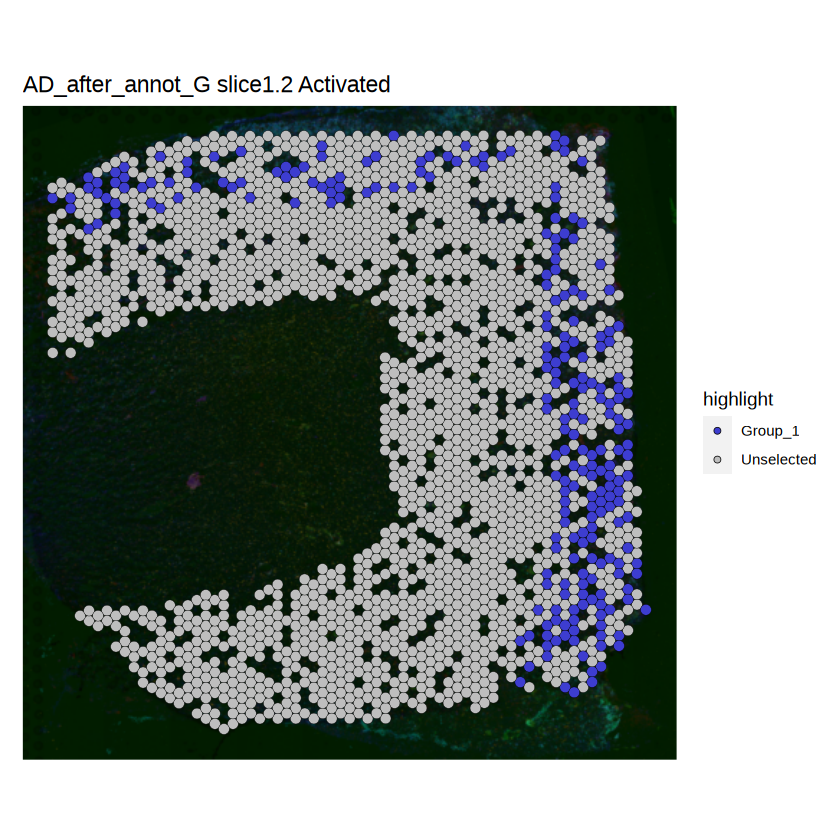

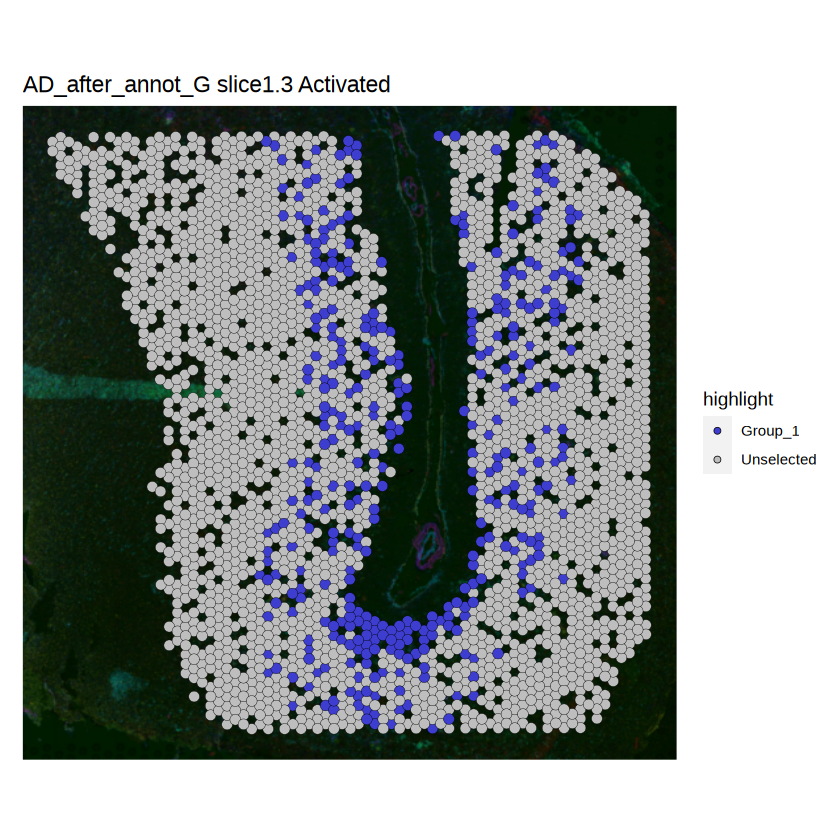

In [8]:
cell_state_list <- c('Homeostatic')

plot1 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])

    file_ly2_3 <- subset(df_filtered1, subset = layer %in% c("Layer 2", "Layer 3"))

    cell <- file_ly2_3$barcode
    # cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#FF0000", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("All_", nm, "_", image, ".pdf", sep = ""), p1, path = dir)
    }
})

cell_state_list <- c('Activated')

plot2 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])

    file_ly2_3 <- subset(df_filtered1, subset = layer %in% c("Layer 2", "Layer 3"))

    cell <- file_ly2_3$barcode
   #  cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#3D3DD0", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("All_", nm, "_", image, ".pdf", sep = ""), p1, path = dir)
    }
})

compare the Ab spots in layers

In [2]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_29_feb.qs")
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)
Idents(file) <- "AB"
file1 <- subset(file, idents = "Level 0")

Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


In [3]:
table(file$sample_ID)
table(file1$sample_ID)
file
file1


AD-1 AD-2 AD-3 
2695 2048 2808 


AD-1 AD-2 AD-3 
 532  522  316 

An object of class Seurat 
97136 features across 7551 samples within 5 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 layers present: data, scale.data
 4 other assays present: Spatial, SCT, RNA, predictions
 2 dimensional reductions calculated: pca, umap
 3 images present: slice1, slice1.2, slice1.3

An object of class Seurat 
97136 features across 1370 samples within 5 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 layers present: data, scale.data
 4 other assays present: Spatial, SCT, RNA, predictions
 2 dimensional reductions calculated: pca, umap
 3 images present: slice1, slice1.2, slice1.3

In [4]:
table(file$sample_ID,file$layer_annotation)
table(file1$AB,file1$layer_annotation, file1$sample_ID)

      
       Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  AD-1     189    1082     450     468     506
  AD-2     147     538     228     724     411
  AD-3     443     991     380     676     318

, ,  = AD-1

         
          Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  Level 0      42     287     105      64      34

, ,  = AD-2

         
          Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  Level 0      54     196      64     143      65

, ,  = AD-3

         
          Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  Level 0      76     116      39      67      18


In [2]:
# Create vectors for the data
layer_2 <- c(22.22, 26.52)
layer_4 <- c(23.33,13.68,6.72)

wilcox.test(layer_2, layer_4)


layer_2 <- c(36.73, 36.43)
layer_4 <- c(28.07,19.75,15.82)


wilcox.test(layer_2, layer_4)

layer_2 <- c(17.16, 11.71)
layer_4 <- c(10.26,9.91,5.66)


wilcox.test(layer_2, layer_4)

################

layer_2 <- c(22.07958922,22.94140176)
layer_4 <- c(19.65973535,14.66809422,9.473684211)
wilcox.test(layer_2, layer_4)



	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 5, p-value = 0.4
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 6, p-value = 0.2
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 6, p-value = 0.2
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 6, p-value = 0.2
alternative hypothesis: true location shift is not equal to 0


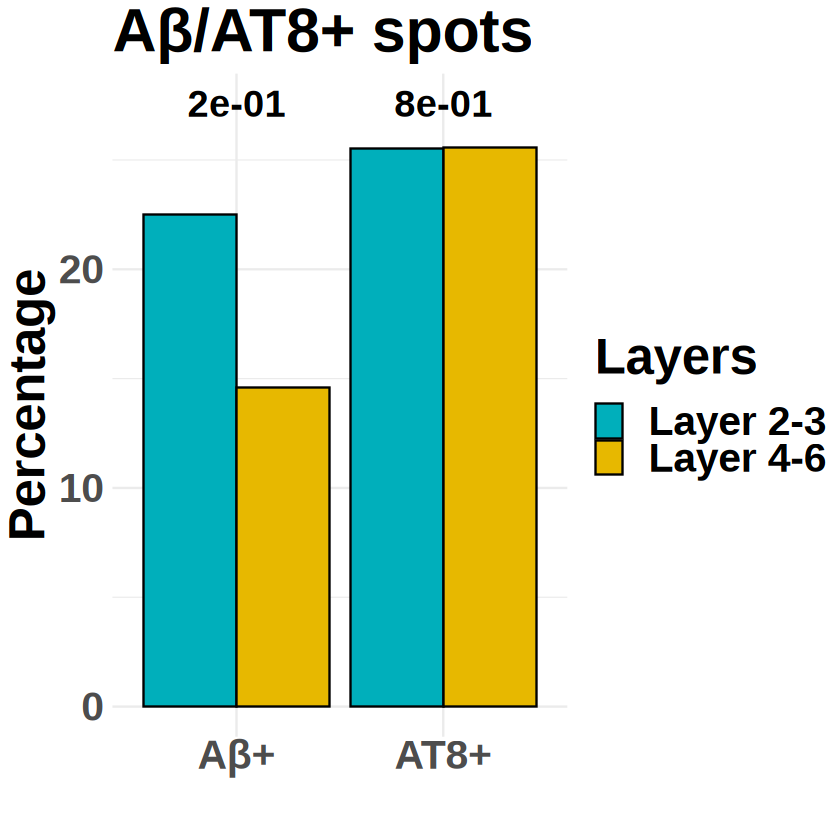

In [7]:
 #read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet8", .name_repair = "minimal")

data <- exl_file[, c(1:4)]
data$p.sci <- format(data$`pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Layers", value = "Layer_val", `Layer 2-3`, `Layer 4-6`)

p <- ggplot(data_long, aes(x = Sample, y = Layer_val, fill = Layers)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("Aβ/AT8+ spots") +
    theme_minimal() +
    scale_fill_manual(values = c("#00AFBB", "#E7B800")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Layer_val) + 2,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
     )  +xlab("")+ylab("Percentage")
p$data$Sample <- factor(p$data$Sample, levels = c('Aβ+','AT8+'))
p

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Aβ+ spots' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Aβ+ spots' in 'mbcsToSbcs': dot substituted for <b2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Aβ+ spots' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Aβ+ spots' in 'mbcsToSbcs': dot substituted for <b2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Aβ+ spots' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Aβ+ spots' in 'mbcsToSbcs': dot substituted for <b2>”


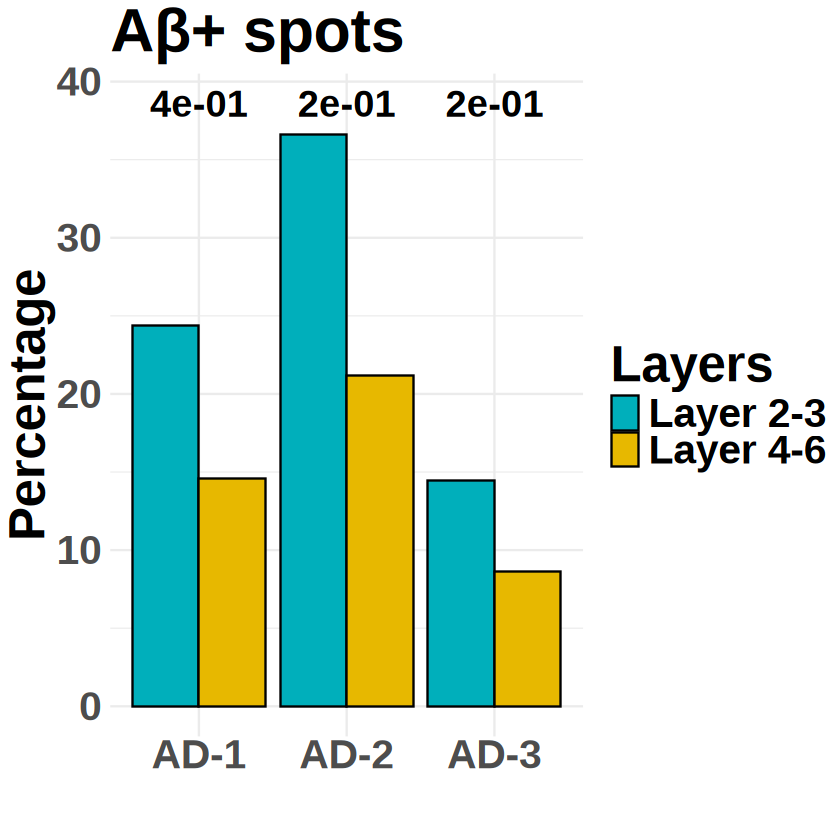

In [17]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet6", .name_repair = "minimal")

data <- exl_file[, c(1:4)]
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Layers", value = "Layer_val", `Layer 2-3`, `Layer 4-6`)

p <- ggplot(data_long, aes(x = Sample, y = Layer_val, fill = Layers)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("Aβ+ spots") +
    theme_minimal() +
    scale_fill_manual(values = c("#00AFBB", "#E7B800")) +
    annotate("text",
        x = c(1, 2,3), y = max(data_long$Layer_val) + 2,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
     )  +xlab("")+ylab("Percentage")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/Abeta_spots_all_layer.pdf", width = 6,height = 5, bg ="white")
p

AT8 spots in each layer

In [10]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_29_feb.qs")
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)
Idents(file) <- "AT8"
file1 <- subset(file, idents = "Level 0")

Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


In [11]:
table(file$sample_ID)
table(file1$sample_ID)
file
file1


AD-1 AD-2 AD-3 
2695 2048 2808 


AD-1 AD-2 AD-3 
 988  530  498 

An object of class Seurat 
97136 features across 7551 samples within 5 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 layers present: data, scale.data
 4 other assays present: Spatial, SCT, RNA, predictions
 2 dimensional reductions calculated: pca, umap
 3 images present: slice1, slice1.2, slice1.3

An object of class Seurat 
97136 features across 2016 samples within 5 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 layers present: data, scale.data
 4 other assays present: Spatial, SCT, RNA, predictions
 2 dimensional reductions calculated: pca, umap
 3 images present: slice1, slice1.2, slice1.3

In [12]:
table(file$sample_ID,file$layer_annotation)
table(file1$AT8,file1$layer_annotation, file1$sample_ID)

      
       Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  AD-1     189    1082     450     468     506
  AD-2     147     538     228     724     411
  AD-3     443     991     380     676     318

, ,  = AD-1

         
          Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  Level 0      42     344     156     372      74

, ,  = AD-2

         
          Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  Level 0     123     214      50     113      30

, ,  = AD-3

         
          Layer 2 Layer 3 Layer 4 Layer 5 Layer 6
  Level 0      19     157     107     170      45


In [5]:
# Create vectors for the data
layer_2 <- c(22.22,31.79)
layer_4 <- c(34.67,79.49,14.62)

wilcox.test(layer_2, layer_4)


layer_2 <- c(83.67,	39.78)
layer_4 <- c(21.93,	15.61,	7.30)


wilcox.test(layer_2, layer_4)

layer_2 <- c(4.29,	15.84)
layer_4 <- c(28.16	,25.15	,14.15)


wilcox.test(layer_2, layer_4)
############################################
layer_2 <- c(23.62002567,27.38414401)
layer_4 <- c(29.58412098, 35.06423983, 12.06477733)
wilcox.test(layer_2, layer_4)


	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 2, p-value = 0.8
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 6, p-value = 0.2
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 1, p-value = 0.4
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum exact test

data:  layer_2 and layer_4
W = 2, p-value = 0.8
alternative hypothesis: true location shift is not equal to 0


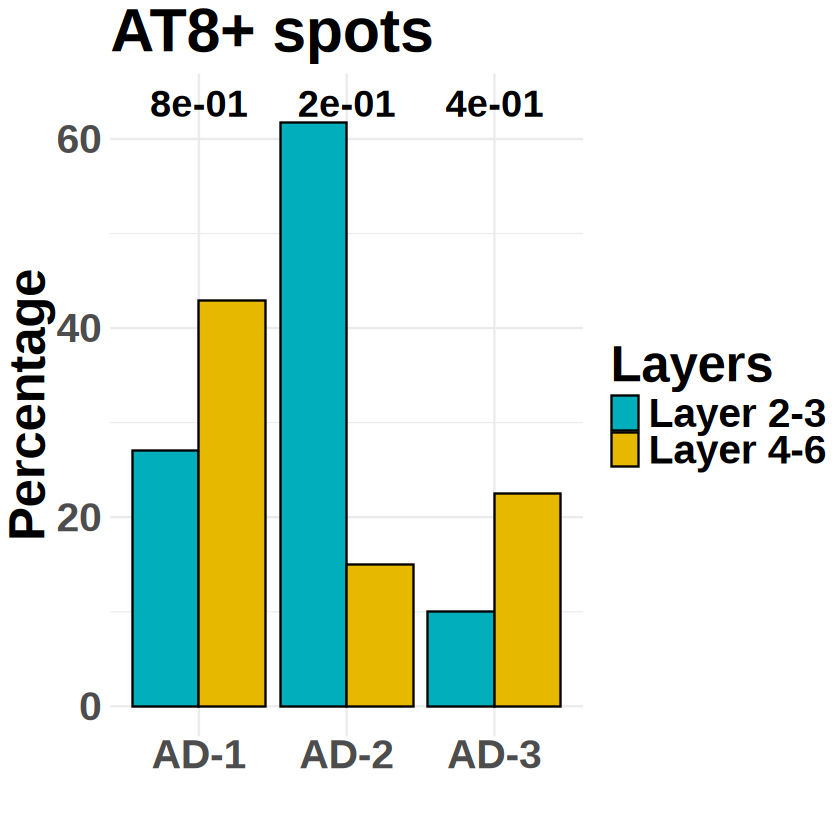

In [18]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet7", .name_repair = "minimal")

data <- exl_file[, c(1:4)]
data$p.sci <- format(data$`AT8-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Layers", value = "Layer_val", `Layer 2-3`, `Layer 4-6`)

p <- ggplot(data_long, aes(x = Sample, y = Layer_val, fill = Layers)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("AT8+ spots") +
    theme_minimal() +
    scale_fill_manual(values = c("#00AFBB", "#E7B800")) +
    annotate("text",
        x = c(1, 2,3), y = max(data_long$Layer_val) + 2,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
     )  +xlab("")+ylab("Percentage")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/AT8_spots_all_layer.pdf", width = 6,height = 5, bg ="white")
p

In [7]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_29_feb.qs")
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)
cell_state_list<- c('Homeostatic','Activated')

Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


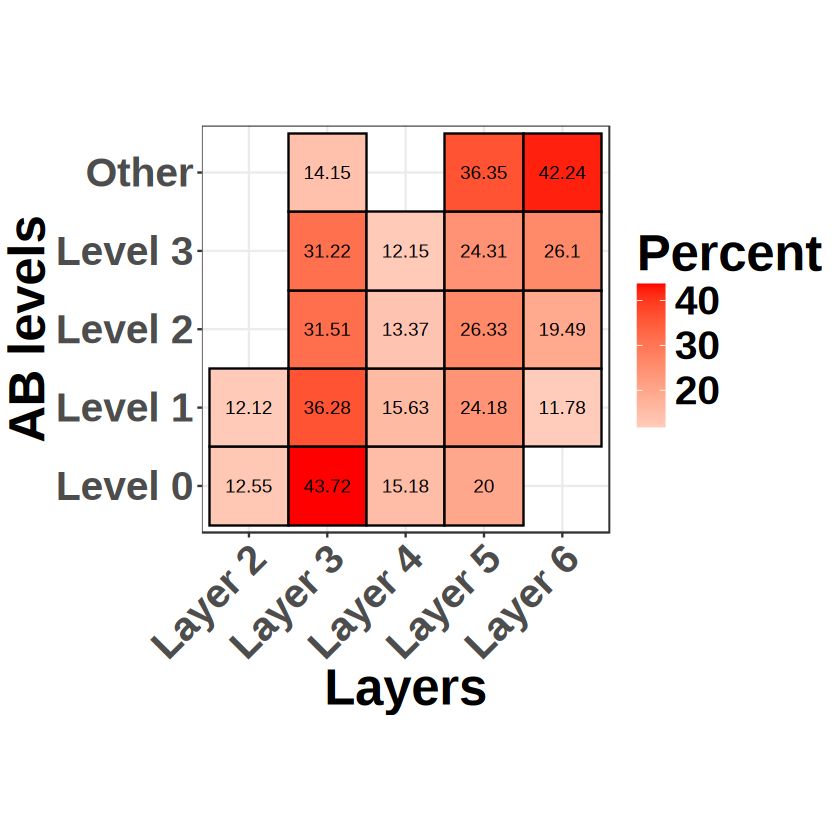

In [8]:
data <- table(file$AB, file$layer_annotation) %>%  as.data.frame() %>% group_by(Var1) %>% mutate(frac = Freq / sum(Freq)*100) %>% 
ungroup() %>%  mutate(Percent = case_when(frac <10 ~ 0, T ~ frac)) %>%filter(Percent>0)
p <- data %>% ggplot(aes(x = Var2, y = Var1, fill = Percent)) +   geom_tile() +  scale_fill_viridis()+
scale_fill_distiller(palette = "Reds", direction = 1, limits = c(0,100)) + xlab("Layers")+ylab("AB levels")+ scale_fill_gradient2(low = "white", high = "red") +
coord_fixed()+geom_tile(color = "black", lwd = 0.5)+theme_bw()+
geom_text(aes(label = round(Percent, digits = 2)))+ theme(text = element_text(size = 30, face = "bold"))
p <- p+theme(axis.text.x = element_text(angle = 45, hjust = 1))

p

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


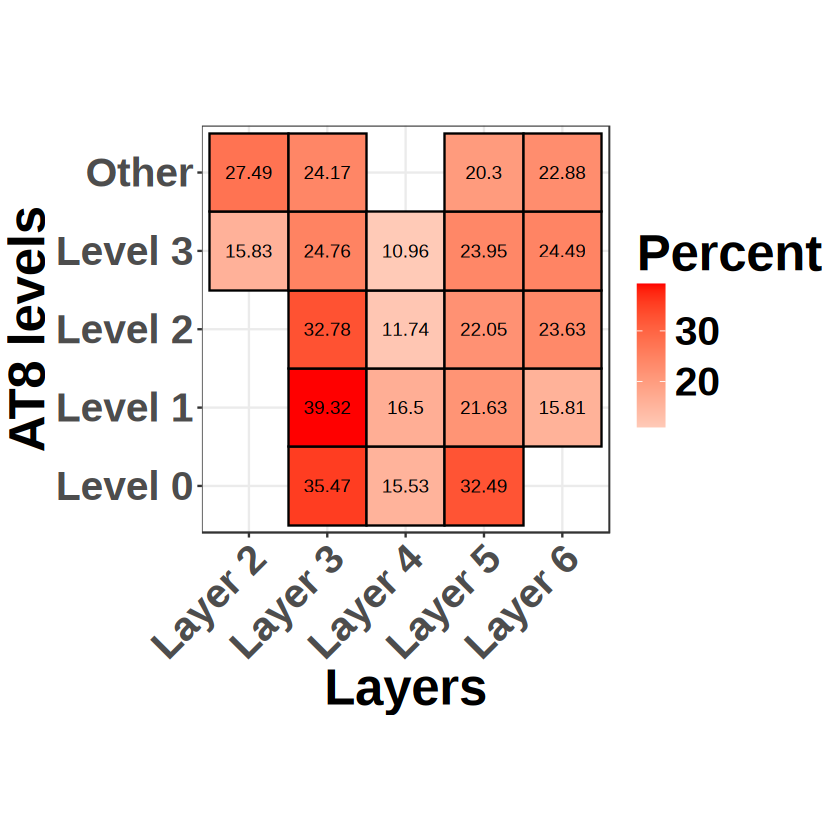

In [9]:
data <- table(file$AT8, file$layer_annotation) %>%  as.data.frame() %>% group_by(Var1) %>% mutate(frac = Freq / sum(Freq)*100) %>% 
ungroup() %>%  mutate(Percent = case_when(frac <10 ~ 0, T ~ frac)) %>%filter(Percent>0)
p <- data %>% ggplot(aes(x = Var2, y = Var1, fill = Percent)) +   geom_tile() +  scale_fill_viridis()+
scale_fill_distiller(palette = "Reds", direction = 1, limits = c(0,100)) + xlab("Layers")+ylab("AT8 levels")+ scale_fill_gradient2(low = "white", high = "red") +
coord_fixed()+geom_tile(color = "black", lwd = 0.5)+theme_bw()+
geom_text(aes(label = round(Percent, digits = 2)))+ theme(text = element_text(size = 30, face = "bold"))
p <- p+theme(axis.text.x = element_text(angle = 45, hjust = 1))

p

Proportion in all layers 2-6

In [16]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
    # ind =1
        nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, brcode= data1$barcode)
        df$Cluster <- droplevels(df$Cluster)
        
#Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>% 
     summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
    table(df_filtered1$Cluster) # in all sample
    })
 table(file$layer_annotation)

[[1]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    231     427     267     657     306 

[[2]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    181     887     194     304     322 



Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    779    2611    1058    1868    1235 

In [21]:
s1 <- "AB"
s2 <- "AT8"
s <- s2

In [28]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
        nm <- c(cell_state_list)[ind]
      df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) # ATB= data1$AT8
        df$Cluster <- droplevels(df$Cluster)
#Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>% 
     summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
      print(s)
     table(df_filtered1[,"Level"])
    })
  table(file@meta.data[,s])

[1] "AT8"
[1] "AT8"


[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    524     695     382     183     104 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    494     734     356     165     139 



Level 0 Level 1 Level 2 Level 3   Other 
   2016    2866    1388     739     542 

In [83]:
layer1 <- c("Layer 2","Layer 3")
layer2 <- c("Layer 4", "Layer 5", "Layer 6")
layer <- layer2

In [84]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
       nm <- c(cell_state_list)[ind]
       df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) # ATB= data1$AT8
        df$Cluster <- droplevels(df$Cluster)
        
# #Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>%
    summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
   df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])


 file_ly <- subset(df_filtered1, subset = Cluster %in% layer)
 table(file_ly[,"Level"])

    })

########## TOTAL ######################### 

file_ly <- subset(file, subset = layer_annotation %in% layer)
 table(file_ly@meta.data[,s])


[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    184     545     295     126      80 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    122     293     203     100     102 


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”



Level 0 Level 1 Level 2 Level 3   Other 
    599    1677    1005     453     427 

each samples

In [112]:
s <- "AT8"

In [113]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }

  
    lapply(1:length(cell_state_list), function(ind) {
       nm <- c(cell_state_list)[ind]
       df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) 
        df$Cluster <- droplevels(df$Cluster)
        
# #Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>%
    summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
   df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
 file_ly2_3 <- subset(df_filtered1, subset = Cluster %in% c("Layer 2","Layer 3"))

# in each sample
layer_val <- lapply(c("AD-1","AD-2","AD-3"), function(i) {
print(i)
df_check <- subset(file_ly2_3, subset = Sample == i)
table(df_check[,"Level"])
})
})

#########################
file_ly2_3 <- subset(file, subset = layer_annotation %in% c("Layer 2","Layer 3"))
table(file_ly@meta.data[,s])
 
layer_val <- lapply(c("AD-1","AD-2","AD-3"), function(i) {
print(i)
df_check <- subset(file_ly2_3, subset = sample_ID == i)
table(df_check@meta.data[,s])   
})
layer_val

[1] "AD-1"
[1] "AD-2"
[1] "AD-3"
[1] "AD-1"
[1] "AD-2"
[1] "AD-3"


[[1]]
[[1]][[1]]

Level 0 Level 1 Level 2 Level 3   Other 
     40      72      34      20      13 

[[1]][[2]]

Level 0 Level 1 Level 2 Level 3 
     86      37       8       1 

[[1]][[3]]

Level 0 Level 1 Level 2 Level 3   Other 
     56      98      94      48      51 


[[2]]
[[2]][[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    176     242      48       4       3 

[[2]][[2]]

Level 0 Level 1 Level 2 Level 3 
     85     109      31       9 

[[2]][[3]]

Level 0 Level 1 Level 2 Level 3   Other 
     44     106      93      57      61 



Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”



Level 0 Level 1 Level 2 Level 3   Other 
   1117    1546     797     439     262 

[1] "AD-1"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-2"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-3"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    386     637     165      45      38 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    337     258      71      18       1 

[[3]]

Level 0 Level 1 Level 2 Level 3   Other 
    176     425     355     237     241 


Chisq val

In [2]:
#homeostatic
data <- c(658,2732,1230,2931)
matrices <- matrix(data, nrow = 2, byrow = TRUE)
matrices
score <- chisq.test(matrices)
score

658,2732
1230,2931



	Pearson's Chi-squared test with Yates' continuity correction

data:  matrices
X-squared = 102.1, df = 1, p-value < 2.2e-16


In [3]:
#activated

data <- c(1068,2322,820,3341)
matrices <- matrix(data, nrow = 2, byrow = TRUE)
matrices
score <- chisq.test(matrices)
score

1068,2322
820,3341



	Pearson's Chi-squared test with Yates' continuity correction

data:  matrices
X-squared = 138.03, df = 1, p-value < 2.2e-16


In [31]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/with_int_KD/check.xlsx", sheet = "Sheet9")
df1<- exl_file[1:2,1:6] 
df2<- exl_file[5,1:6] 
df3<- exl_file[8:9,1:6]
df4<- exl_file[12,1:6]

df1
df2
df3
df4

Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Homeostatic,305,820,456,206,101
Activated,396,818,389,162,123


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Total number,1370,3250,1698,724,509


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Homeostatic,1583,763,307,101,NA
Activated,1492,674,285,123,NA


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Total number,6181,2931,1233,509,NA


In [32]:
# pred1
df1 <- gather(df1, "Level", "pred_num1", -c(Cell_state))

df1 <- df1 %>%
  mutate(pred_num1 = as.numeric(pred_num1))

# pred2

df3 <- gather(df3, "Level", "pred_num2", -c(Cell_state))

df3 <- df3 %>%
  mutate(pred_num2 = as.numeric(pred_num2))

df3_merge <- merge(x=df1,y=df3, 
          by=c("Cell_state","Level"), all.x=TRUE, sort = FALSE)

# pred3
df2 <- gather(df2, "Level", "pred_num3", -c(Cell_state))
df2 <- df2 %>%
  mutate(pred_num3 = as.numeric(pred_num3))

# pred4
df4 <- gather(df4, "Level", "pred_num4", -c(Cell_state))
df4 <- df4 %>%
  mutate(pred_num4 = as.numeric(pred_num4))

df4_merge <- merge(x=df2,y=df4, 
          by=c("Level","Cell_state"), all.x=TRUE)

df_merged <- merge(x=df3_merge,y=df4_merge, 
          by=c("Level"), all.x=TRUE)

check<- df_merged %>% mutate(pred_num3 = pred_num3 - pred_num1) %>% mutate(pred_num4 = pred_num4 - pred_num2) %>% select(-Cell_state.y)

chisq_score <- lapply(seq(dim(check)[1]-2), function(x){
data <- check[,c(3:6)]
# Convert each row into a matrix
#x=1
matrices <- matrix(as.numeric(data[x, ]), nrow = 2, byrow = TRUE)
# Print the matrices
print(matrices)
score <- chisq.test(matrices)
return(sprintf('%s, %s, %s', check$Level[x], check$Cell_state.x[x], (format(score$p.value, digits=3,scientific=TRUE))))

}) 

as.data.frame(unlist(chisq_score))

     [,1] [,2]
[1,]  305 1583
[2,] 1065 4598
     [,1] [,2]
[1,]  396 1492
[2,]  974 4689
     [,1] [,2]
[1,]  820  763
[2,] 2430 2168
     [,1] [,2]
[1,]  818  674
[2,] 2432 2257
     [,1] [,2]
[1,]  456  307
[2,] 1242  926
     [,1] [,2]
[1,]  389  285
[2,] 1309  948
     [,1] [,2]
[1,]  206  101
[2,]  518  408
     [,1] [,2]
[1,]  162  123
[2,]  562  386


unlist(chisq_score)
<chr>
"Level 0, Homeostatic, 1.06e-02"
"Level 0, Activated, 2.6e-04"
"Level 1, Homeostatic, 4.89e-01"
"Level 1, Activated, 4.95e-02"
"Level 2, Homeostatic, 2.51e-01"
"Level 2, Activated, 9.32e-01"
"Level 3, Homeostatic, 7.37e-04"
"Level 3, Activated, 5.06e-01"


compartive barplot 

All

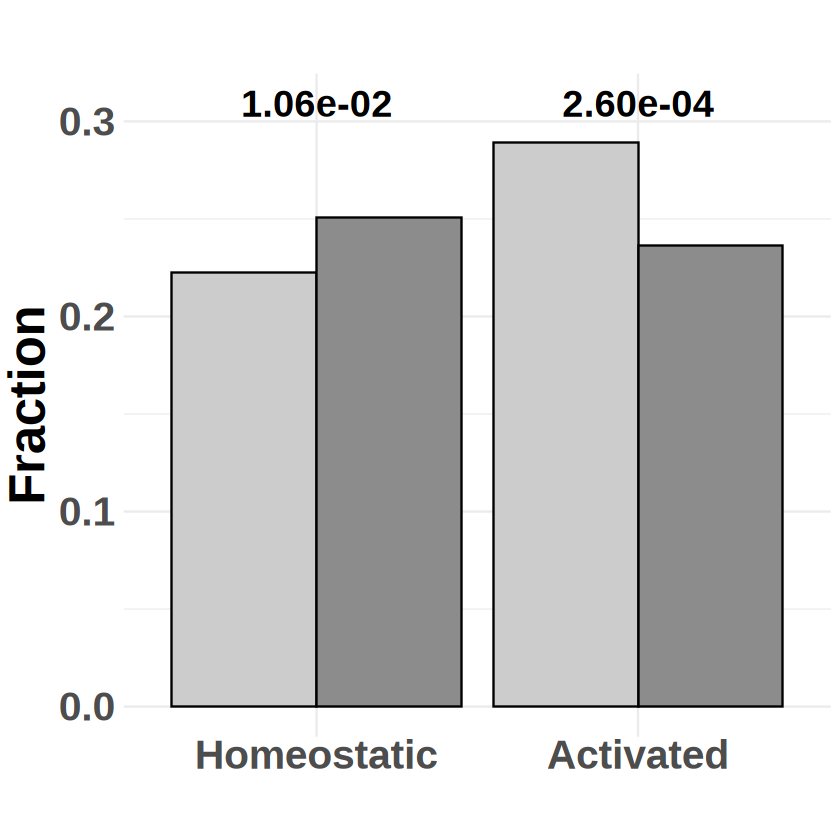

In [11]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet1", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold",color = "black"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
    ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/All_AB_all_layer.pdf", width = 6,height = 5, bg ="white")
p

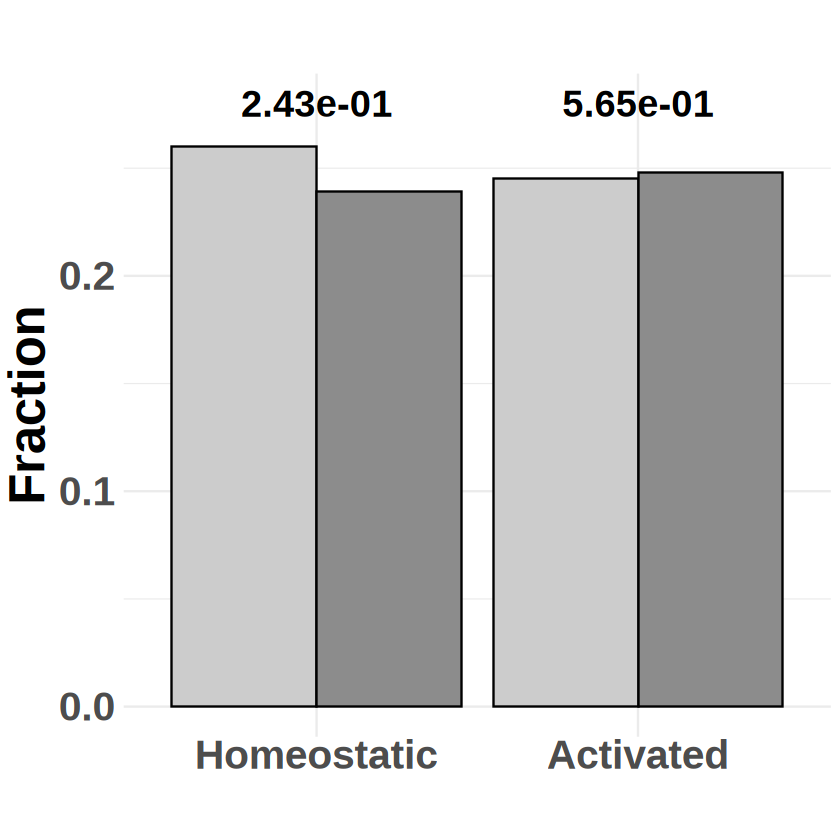

In [17]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet1", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
    ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/All_AT8_all_layer.pdf", width = 6,height = 5 ,bg ="white")
p

layer 2-3

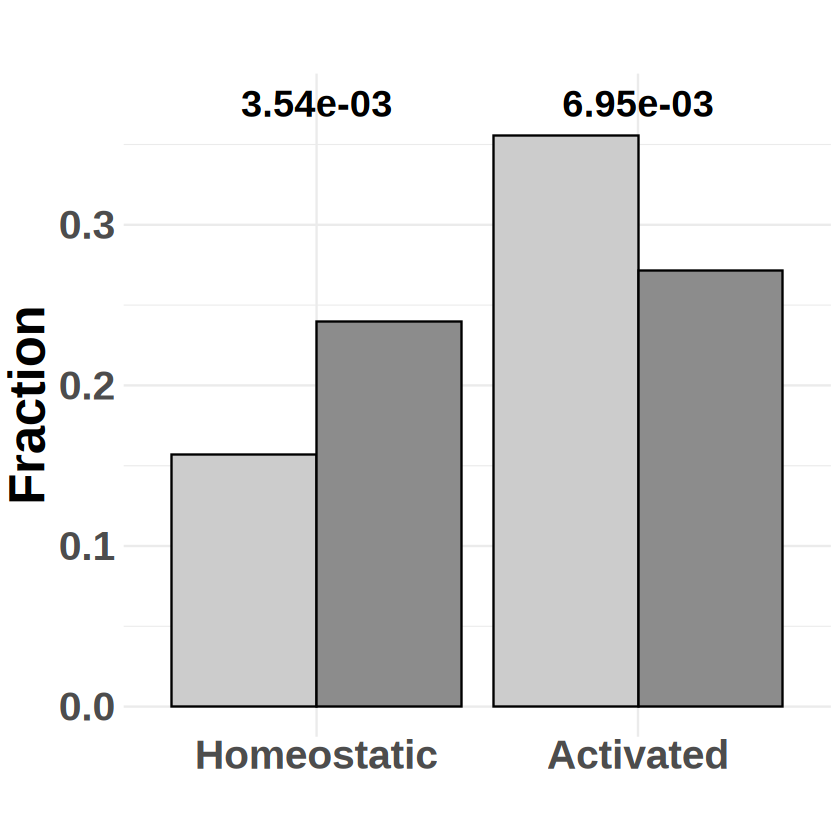

In [18]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet2", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
            ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/All_AB_2-3layer.pdf", width = 6,height = 5,bg ="white")
p

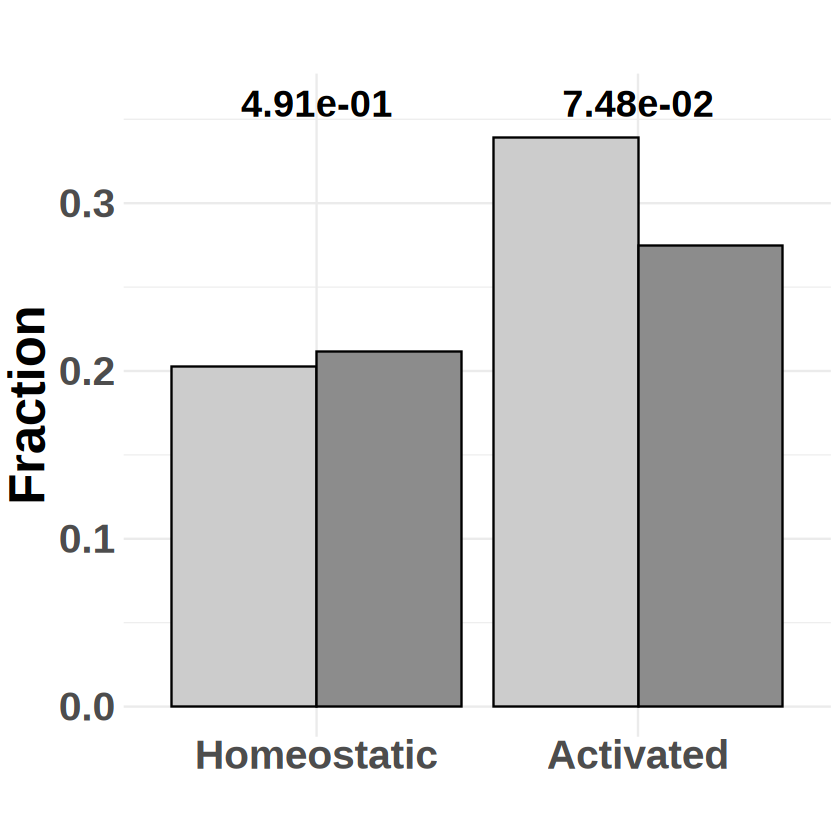

In [19]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet2", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
        ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/All_AT8_2-3layer.pdf", width = 6,height = 5,bg ="white")
p

layer 4/5/6

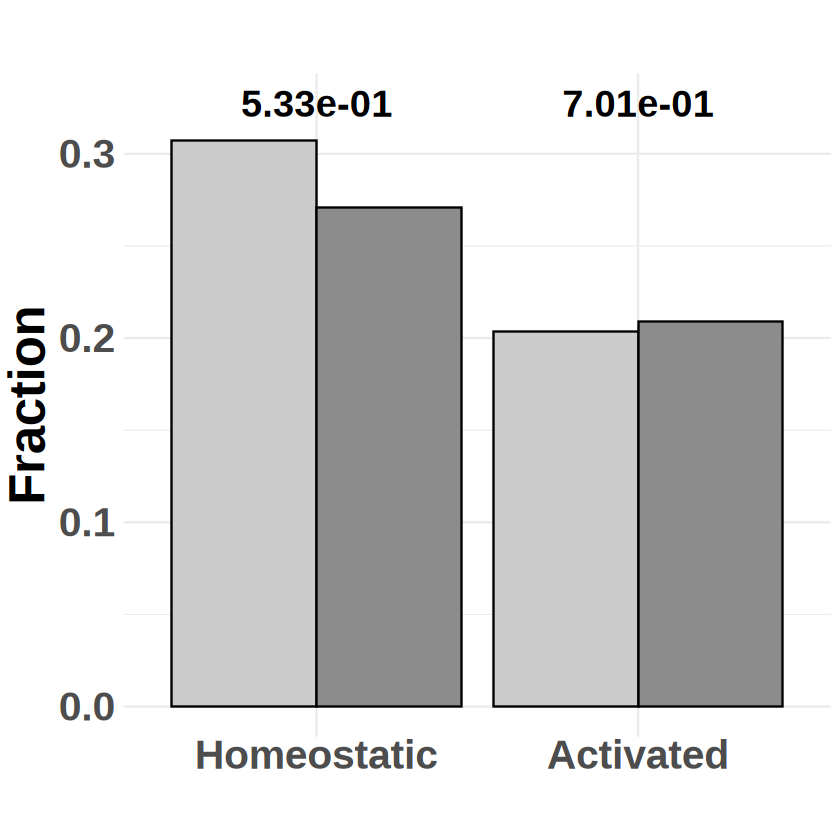

In [28]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet3", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
    )+ NoLegend()+xlab("")+ylab("Fraction")

ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/All_AB_4-6layer.pdf", width = 6,height = 5,bg ="white")
p

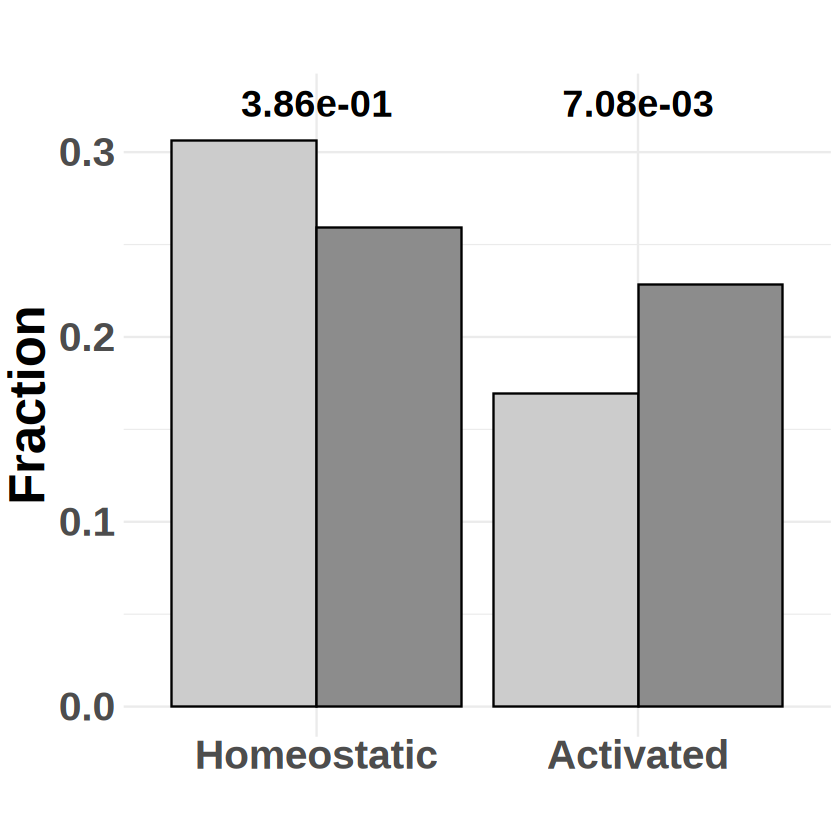

In [29]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet3", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
            ) + NoLegend()+xlab("")+ylab("Fraction")

ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/All_AT8_4-6layer.pdf", width = 6,height = 5,bg ="white")
p

AD samples

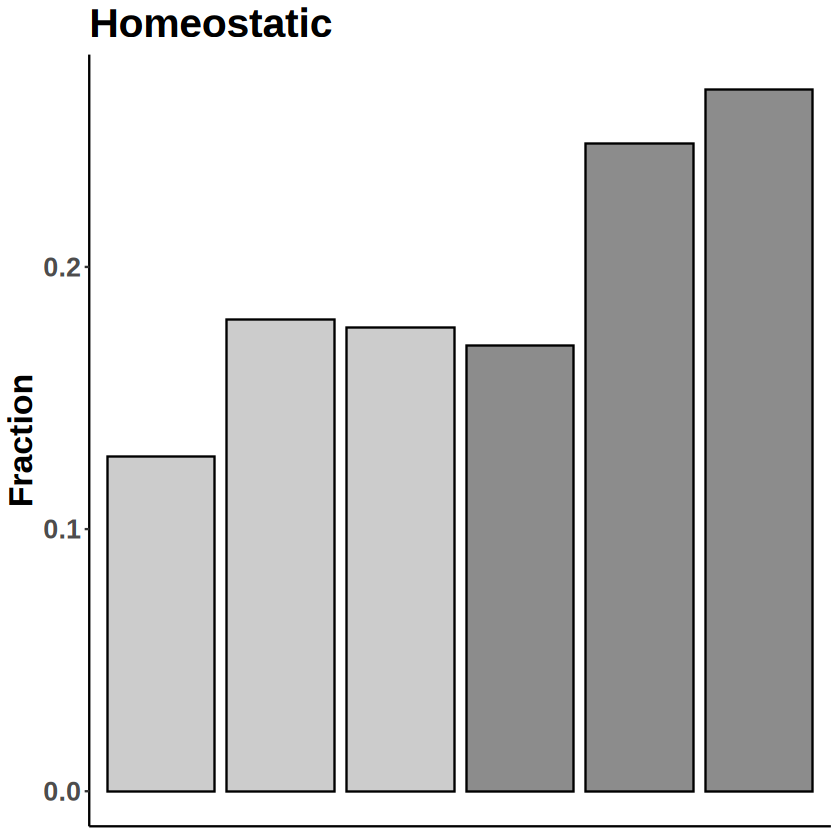

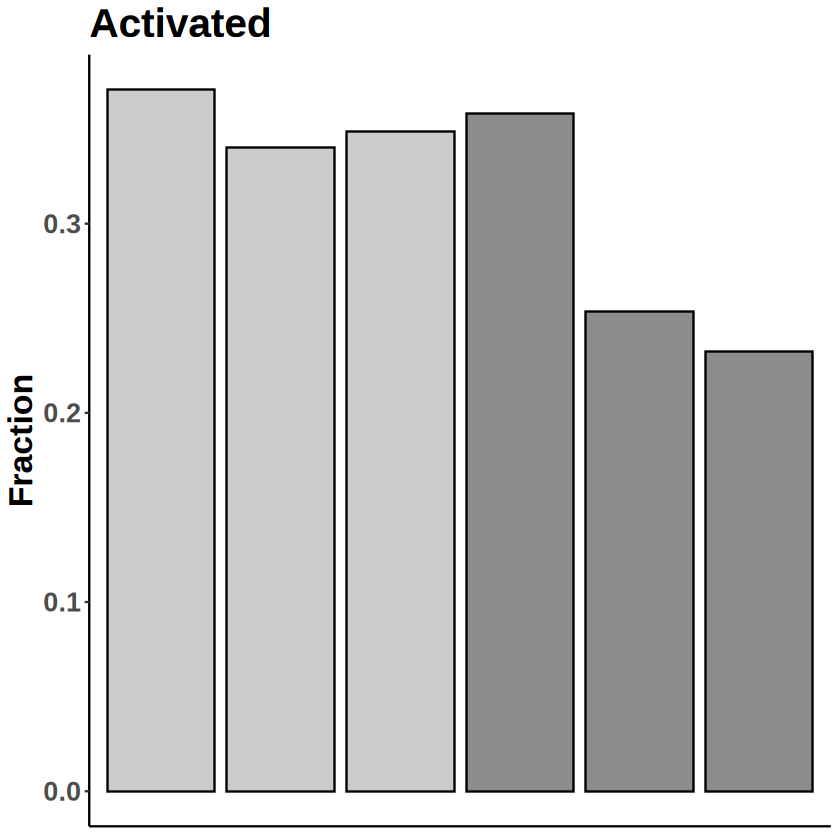

In [10]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
  df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
  df_p_val <- data.frame(
    Ab_Type = c("Ab-Others", "Ab-Others", "Ab-Others"),
    group1 = c("AD-1", "AD-2", "AD-3"),
    group2 = c("AD-1", "AD-2", "AD-3"),
    p.val = signif(as.numeric(df$`Ab-pval`)[1:3], digits = 3)
    
  )
df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)


# Create a new variable combining Ab_Type and sample
df$sample_Ab <- factor(paste(df$Ab_Type, df$sample), levels = unique(paste(df$Ab_Type, df$sample)))

# Iterate through unique levels of Cell_state
p <- ggplot(df, aes(x = sample_Ab, y = Ab_Value, fill = Ab_Type)) +
  geom_bar(position = "dodge", stat = "identity", colour = 'black') +
  ggtitle(unique_cell_states[x]) +
 # theme_minimal() +
 theme_classic()+NoLegend()+
  scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
  theme(text = element_text(size = 20, face = "bold"),
        axis.text.x = element_text(angle = 45, hjust = 1)) +
  #stat_pvalue_manual(df_p_val, label = 'p.sci', y.position = max(df$Ab_Value) + 0.01, size = 6, face = "bold") +
  #NoLegend() +
  xlab("Samples") +
  ylab("Fraction")+
   theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank())
plot(p)

  plots[[x]] <- p  # Store the plot in the list
})

ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_All_AB_2-3layer_samples_hom.pdf", width = 4,height =4,bg ="white")
ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/com_All_AB_2-3layer_samples_act.pdf", width = 4,height =4,bg ="white")


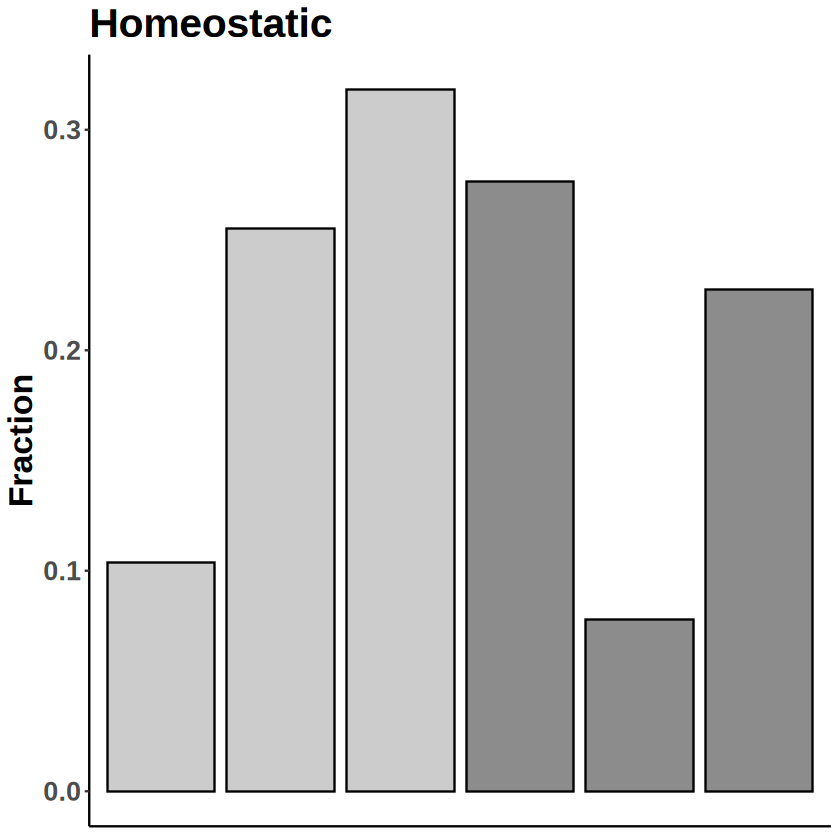

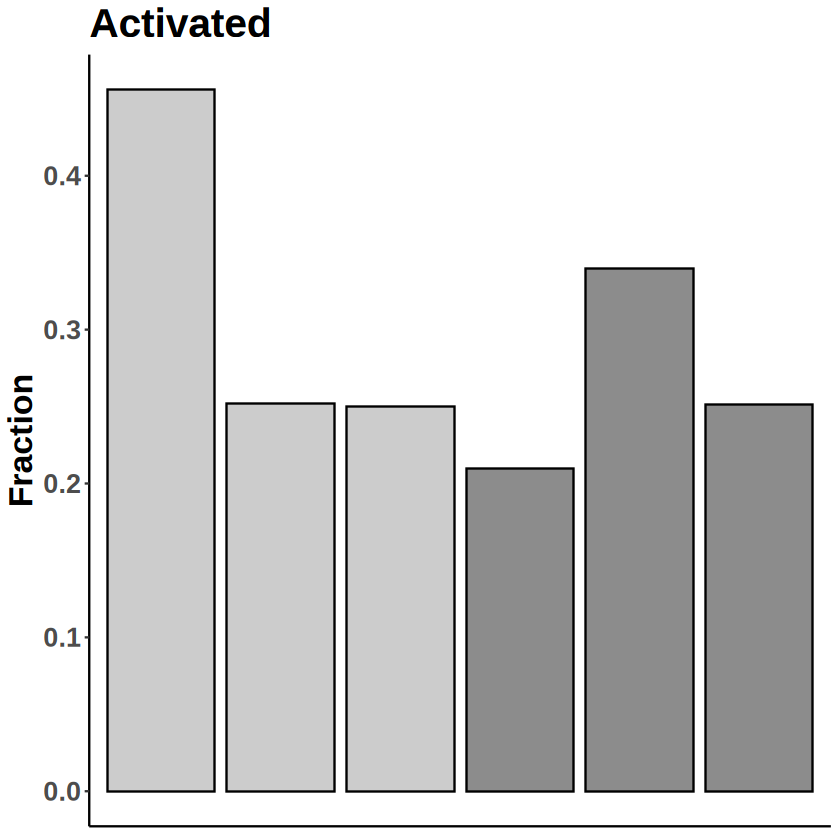

In [12]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
    df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
    df_p_val <- data.frame(
        AT8_Type = c("AT8-Others", "AT8-Others", "AT8-Others"),
        group1 = c("AD-1", "AD-2", "AD-3"),
        group2 = c("AD-1", "AD-2", "AD-3"),
        p.val = signif(df$`AT8-pval`[1:3], digits = 3)
    )
    df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

# Create a new variable combining AT8_Type and sample
df$sample_AT8 <- factor(paste(df$AT8_Type, df$sample), levels = unique(paste(df$AT8_Type, df$sample)))

# Iterate through unique levels of Cell_state
p <- ggplot(df, aes(x = sample_AT8, y = AT8_Value, fill = AT8_Type)) +
  geom_bar(position = "dodge", stat = "identity", colour = 'black') +
  ggtitle(unique_cell_states[x]) +
 theme_classic()+NoLegend()+
  scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
  theme(text = element_text(size = 20, face = "bold"),
        axis.text.x = element_text(angle = 45, hjust = 1)) +
  xlab("Samples") +
  ylab("Fraction")+
   theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank())
plot(p)
plots[[x]] <- p # Store the plot in the list
})


ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_All_AT8_2-3layer_samples_hom.pdf", width = 4,height =4,bg ="white")
ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_All_AT8_2-3layer_samples_act.pdf", width = 4,height =4,bg ="white")


In [30]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
  df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
  df_p_val <- data.frame(
    Ab_Type = c("Ab-Others", "Ab-Others", "Ab-Others"),
    group1 = c("AD-1", "AD-2", "AD-3"),
    group2 = c("AD-1", "AD-2", "AD-3"),
    p.val = signif(as.numeric(df$`Ab-pval`)[1:3], digits = 3)
    
  )
df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

  p <- ggplot(df, aes(x = sample, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = 'black') +
    ggtitle(unique_cell_states[x]) +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c"))+
    theme(text = element_text(size = 30, face = "bold"),
          axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_pvalue_manual(df_p_val, label = 'p.sci', y.position = max(df$Ab_Value) + 0.01,size = 6, face ="bold")+
     NoLegend()+xlab("Samples")+ylab("Fraction")

  plots[[x]] <- p  # Store the plot in the list
})
    
ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/All_AB_2-3layer_samples_hom.pdf", width = 6,height =7,bg ="white")

ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/All_AB_2-3layer_samples_act.pdf", width = 6,height = 7,bg ="white")

In [31]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
    df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
    df_p_val <- data.frame(
        AT8_Type = c("AT8-Others", "AT8-Others", "AT8-Others"),
        group1 = c("AD-1", "AD-2", "AD-3"),
        group2 = c("AD-1", "AD-2", "AD-3"),
        p.val = signif(df$`AT8-pval`[1:3], digits = 3)
    )
    df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

    p <- ggplot(df, aes(x = sample, y = AT8_Value, fill = AT8_Type)) +
        geom_bar(position = "dodge", stat = "identity", colour = "black") +
        ggtitle(unique_cell_states[x]) +
        theme_minimal() +
        scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
        theme(
            text = element_text(size = 30, face = "bold"),
            axis.text.x = element_text(angle = 45, hjust = 1)
        ) +
        stat_pvalue_manual(df_p_val, label = "p.sci", y.position = max(df$AT8_Value) + 0.01,size = 6, face ="bold")+
          NoLegend()+xlab("Samples")+ylab("Fraction")
    plots[[x]] <- p # Store the plot in the list
})


ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/All_AT8_2-3layer_samples_hom.pdf", width = 6,height = 7,bg ="white")

ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/All_AT8_2-3layer_samples_act.pdf", width = 6,height = 7,bg ="white")

Cell_state,Layer 2,Layer 3,Layer 4,Layer 5,Layer 6
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Homeostatic,0.2965340,0.1635389,0.2523629,0.3517131,0.2477733
Activated,0.2323492,0.3397166,0.1833648,0.1627409,0.2607287


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


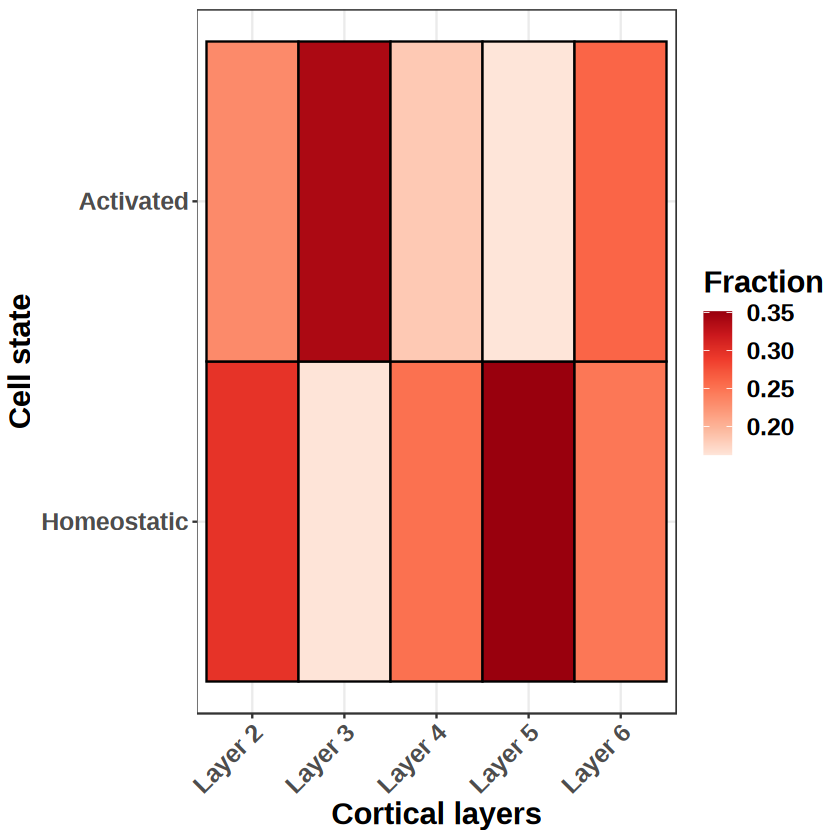

In [32]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/All_plot_data.xlsx", sheet = "Sheet5", .name_repair = "minimal")
exl_file

data <- exl_file %>% gather("Layer", "Fraction", -Cell_state)
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
p <- data %>% ggplot(aes(x = Cell_state , y = Layer, fill = Fraction)) +   geom_tile() +  scale_fill_viridis()+
scale_fill_distiller(palette = "Reds", direction = 1) + 
xlab("Cell state")+ylab("Cortical layers")+ 
#scale_fill_gradient2(low = "white", high = "red") + 
#ggtitle("layers (with top 25%)")+
#coord_fixed()+
coord_flip()+
geom_tile(color = "black", lwd = 0.5)+
theme_bw() + 
#geom_text(aes(label = round(Fraction, digits = 3)))+ 
  theme(text = element_text(size = 18, face = "bold"))
p <- p+theme(axis.text.x = element_text(angle = 45, hjust = 1))
#pdf("heatmap.pdf", height = 6, width = 6)
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/All_fact_layers_heatmap.pdf", width = 6,height = 2.5)
plot(p)